In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np
import itertools
from tensorflow.keras.models import load_model
import os
import cv2
from PIL import Image, ExifTags

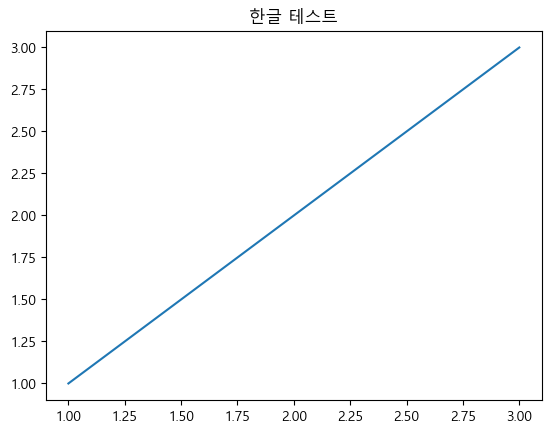

In [2]:
# 한글 폰트 설정 (Windows는 'Malgun Gothic', Mac은 'AppleGothic', Ubuntu는 'NanumGothic' 등)
plt.rc('font', family='Malgun Gothic')  # Windows의 경우

# 한글이 깨지지 않도록 마이너스 폰트 설정
plt.rcParams['axes.unicode_minus'] = False

# 테스트 그래프
plt.plot([1, 2, 3], [1, 2, 3])
plt.title("한글 테스트")  # 한글이 깨지지 않는지 확인
plt.show()

이미지 로드 및 RGB 값 추출

모델 학습은 아나콘다 프롬프트에서 진행

yolo detect train data="C:/Users/ahsld/Desktop/JOLJAK/basic.yaml" model=yolov8s.pt epochs=100 imgsz=640 batch=16 device=0 patience=10

yolo detect train data="C:/Users/ahsld/Desktop/JOLJAK/basic.yaml" model=yolov8s.pt epochs=300 imgsz=1024 batch=32 device=0 workers=8 patience=15 lr0=0.01 warmup_epochs=3


yolo detect train data="C:/Users/win/Desktop/공부/이매지니어/JOLJAK/basic.yaml" model="yolov8n.pt" epochs=100 imgsz=640 batch=16
lr0=0.01 momentum=0.937 weight_decay=0.0005 iou=0.5 nms=0.45 
augment=True device=0 patience=10


yolo test

저장된 모델을 불러와서 예측 레이블(Pred)과 실제 레이블(TRUE) 을 비교하여 이미지와 함께 출력


0: 640x640 4 tom_fruit_breaker_polys, 2 tom_fruit_pink_polys, 8 tom_fruit_red_polys, 37.0ms
Speed: 9.2ms preprocess, 37.0ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)


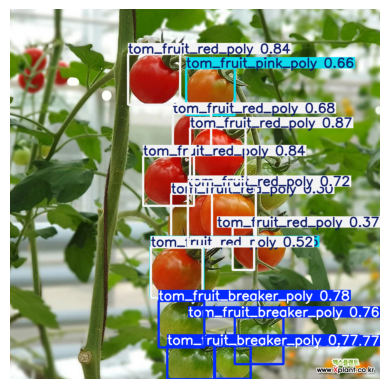


0: 448x640 3 tom_fruit_breaker_polys, 2 tom_fruit_red_polys, 0.0ms
Speed: 3.2ms preprocess, 0.0ms inference, 16.6ms postprocess per image at shape (1, 3, 448, 640)


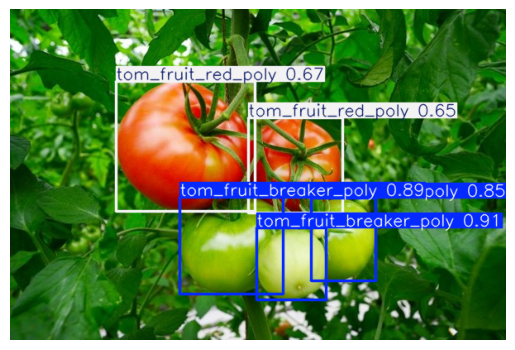


0: 480x640 2 tom_fruit_breaker_polys, 3 tom_fruit_pink_polys, 16.5ms
Speed: 3.0ms preprocess, 16.5ms inference, 5.4ms postprocess per image at shape (1, 3, 480, 640)


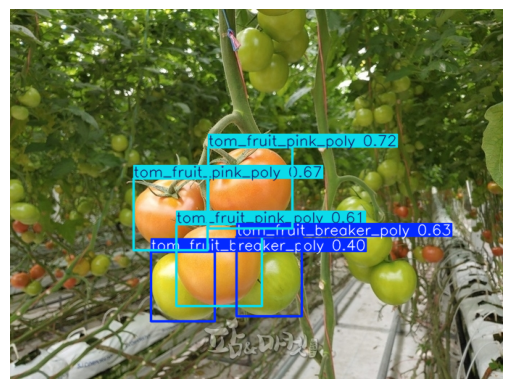


0: 384x640 2 tom_fruit_breaker_polys, 1 tom_fruit_pink_poly, 2 tom_fruit_red_polys, 18.2ms
Speed: 0.0ms preprocess, 18.2ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


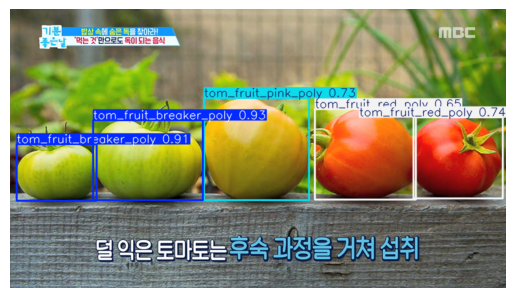


0: 544x640 2 tom_fruit_breaker_polys, 5 tom_fruit_pink_polys, 5 tom_fruit_red_polys, 23.2ms
Speed: 0.0ms preprocess, 23.2ms inference, 4.8ms postprocess per image at shape (1, 3, 544, 640)


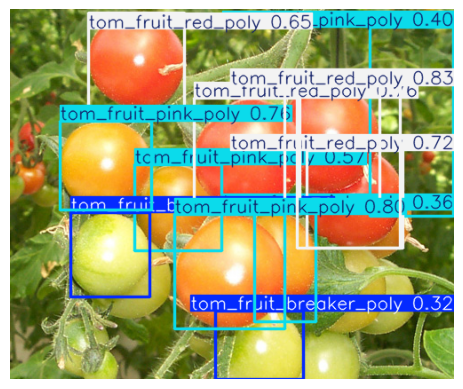


0: 448x640 3 tom_fruit_breaker_polys, 15 tom_fruit_pink_polys, 2 tom_fruit_red_polys, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 4.0ms postprocess per image at shape (1, 3, 448, 640)


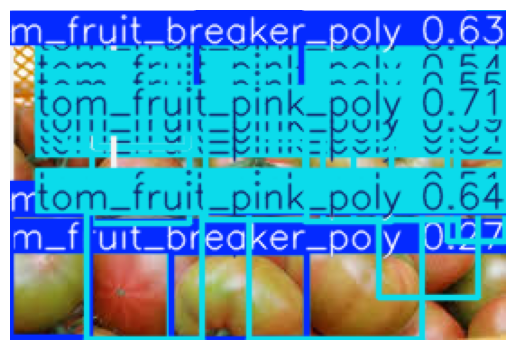


0: 448x640 1 tom_fruit_breaker_poly, 3 tom_fruit_pink_polys, 7 tom_fruit_red_polys, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


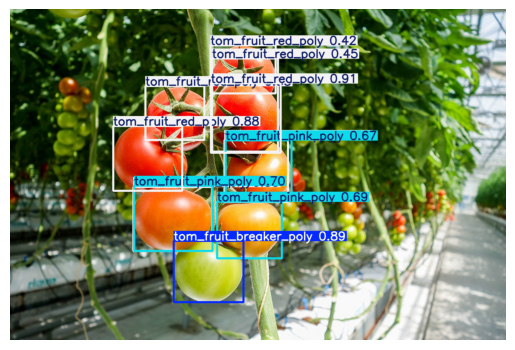


0: 448x640 2 tom_fruit_breaker_polys, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


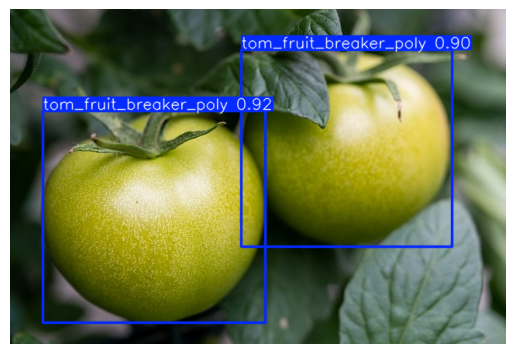


0: 448x640 1 tom_fruit_breaker_poly, 4 tom_fruit_red_polys, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 5.9ms postprocess per image at shape (1, 3, 448, 640)


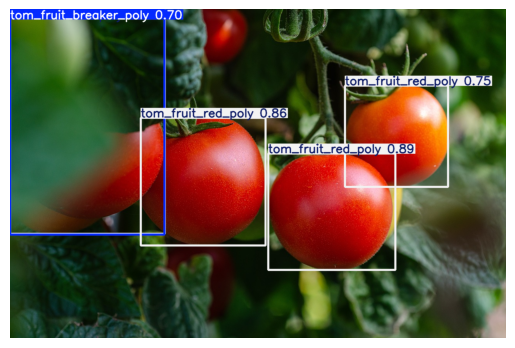


0: 448x640 1 tom_fruit_breaker_poly, 2 tom_fruit_pink_polys, 2 tom_fruit_red_polys, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 9.0ms postprocess per image at shape (1, 3, 448, 640)


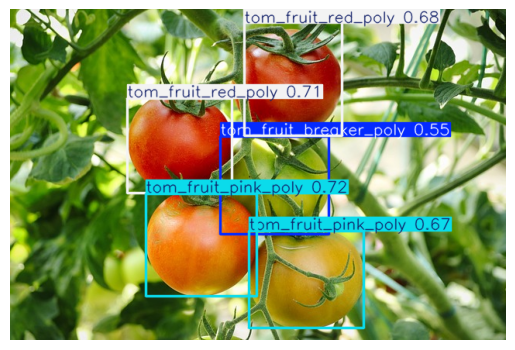


0: 448x640 2 tom_fruit_breaker_polys, 2 tom_fruit_red_polys, 39.0ms
Speed: 0.0ms preprocess, 39.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


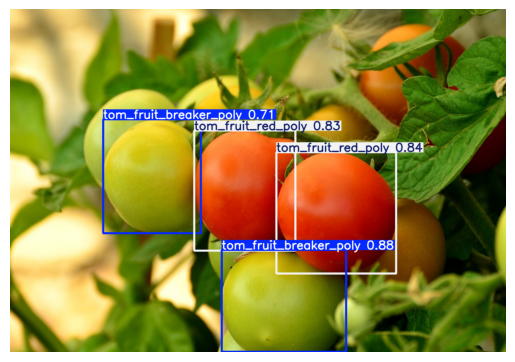


0: 256x640 1 tom_fruit_breaker_poly, 6 tom_fruit_pink_polys, 15 tom_fruit_red_polys, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 6.7ms postprocess per image at shape (1, 3, 256, 640)


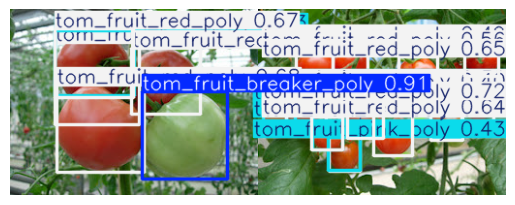


0: 384x640 3 tom_fruit_breaker_polys, 4 tom_fruit_pink_polys, 15 tom_fruit_red_polys, 27.5ms
Speed: 4.0ms preprocess, 27.5ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)


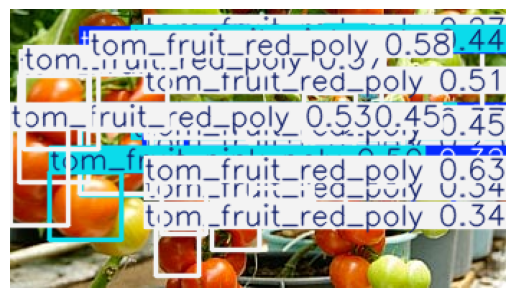

In [21]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# YOLO 모델 로드
model = YOLO('C:/Users/win/runs/detect/train2/weights/best.pt')

# 수정된 클래스 이름이 포함된 YAML 파일 경로
yaml_path = 'C:/Users/win/Desktop/공부/이매지니어/JOLJAK/basic.yaml'

# 테스트 이미지 폴더 경로
test_image_folder = 'D:/JOLJAK/TOMATO_Test'

# 폴더 내 이미지 파일들을 순회하면서 예측 실행
for filename in os.listdir(test_image_folder):
    # 확장자가 JPG, WEBP, JFIF인지 확인
    if filename.lower().endswith(('.jpg', '.webp', '.jfif')):
        image_path = os.path.join(test_image_folder, filename)
        
        # 이미지 불러오기
        img = cv2.imread(image_path)
        
        # YOLO 예측 수행 (변경된 YAML 파일 지정)
        results = model.predict(source=img, data=yaml_path)

        # 예측 결과를 표시할 이미지 생성
        img_with_predictions = results[0].plot()

        # 결과 이미지 출력
        plt.imshow(cv2.cvtColor(img_with_predictions, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()



0: 640x640 4 tom_fruit_breaker_polys, 2 tom_fruit_pink_polys, 8 tom_fruit_red_polys, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 16.5ms postprocess per image at shape (1, 3, 640, 640)


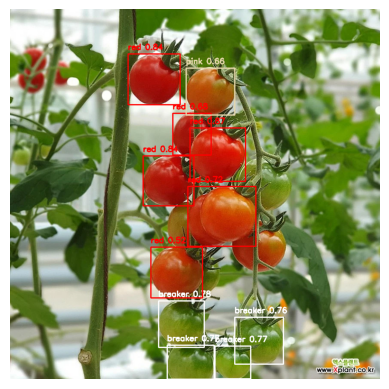


0: 448x640 3 tom_fruit_breaker_polys, 2 tom_fruit_red_polys, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


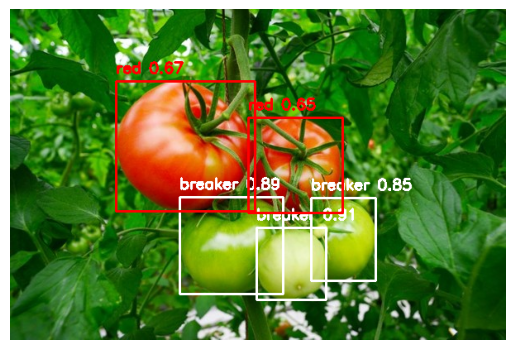


0: 480x640 2 tom_fruit_breaker_polys, 3 tom_fruit_pink_polys, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


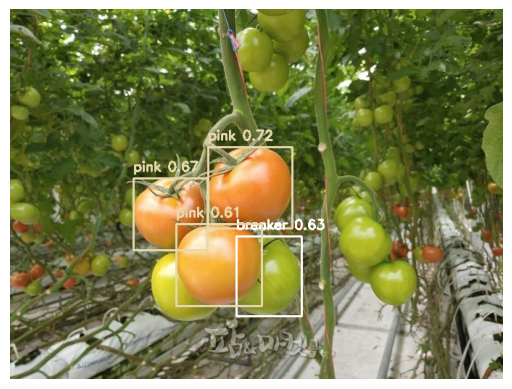


0: 384x640 2 tom_fruit_breaker_polys, 1 tom_fruit_pink_poly, 2 tom_fruit_red_polys, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


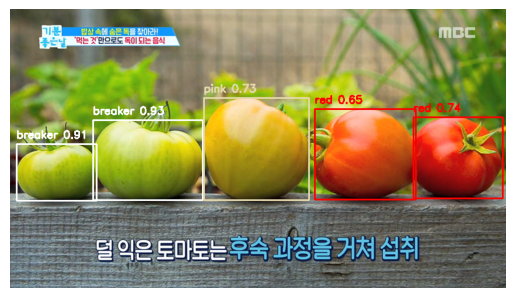


0: 544x640 2 tom_fruit_breaker_polys, 5 tom_fruit_pink_polys, 5 tom_fruit_red_polys, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 544, 640)


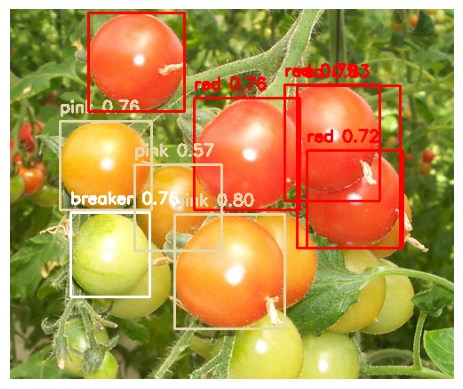


0: 448x640 3 tom_fruit_breaker_polys, 15 tom_fruit_pink_polys, 2 tom_fruit_red_polys, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


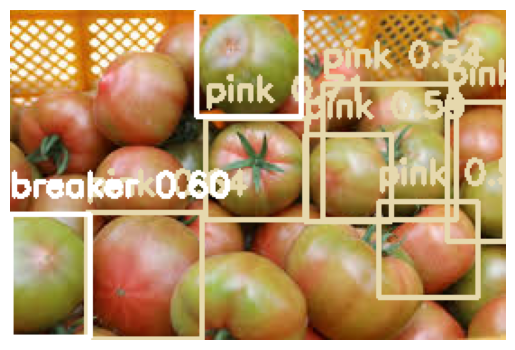


0: 448x640 1 tom_fruit_breaker_poly, 3 tom_fruit_pink_polys, 7 tom_fruit_red_polys, 0.0ms
Speed: 15.6ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


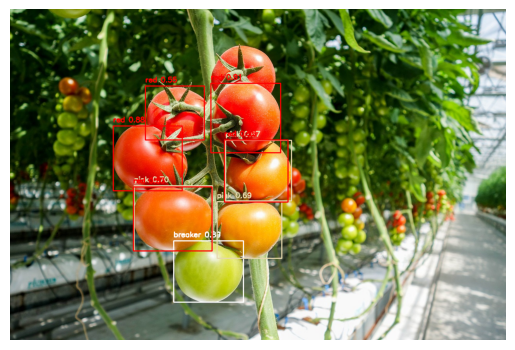


0: 448x640 2 tom_fruit_breaker_polys, 14.0ms
Speed: 0.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


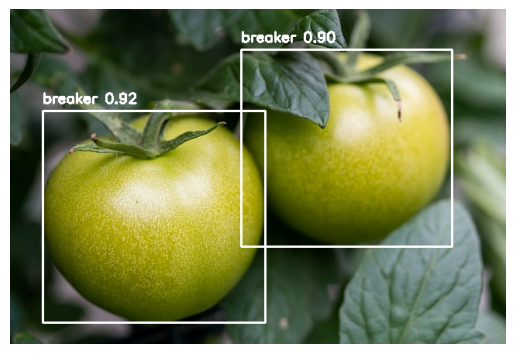


0: 448x640 1 tom_fruit_breaker_poly, 4 tom_fruit_red_polys, 0.3ms
Speed: 2.4ms preprocess, 0.3ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


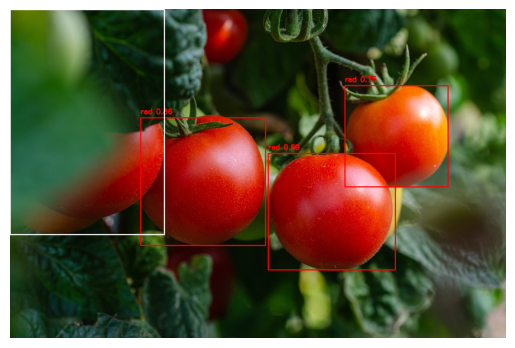


0: 448x640 1 tom_fruit_breaker_poly, 2 tom_fruit_pink_polys, 2 tom_fruit_red_polys, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


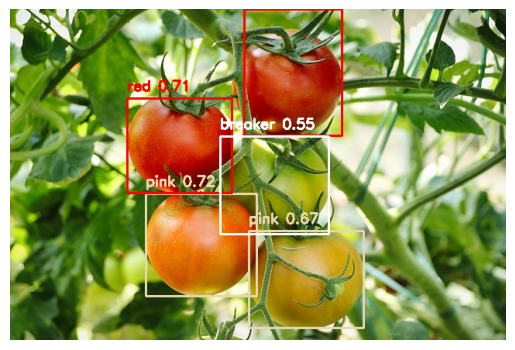


0: 448x640 2 tom_fruit_breaker_polys, 2 tom_fruit_red_polys, 26.8ms
Speed: 0.0ms preprocess, 26.8ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


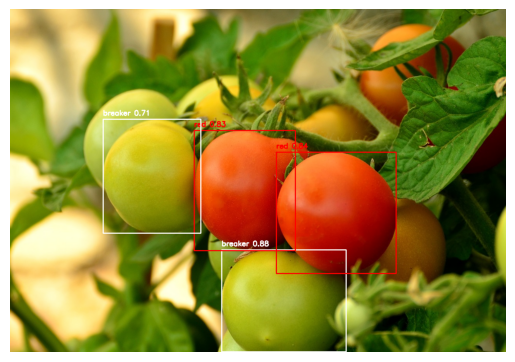


0: 256x640 1 tom_fruit_breaker_poly, 6 tom_fruit_pink_polys, 15 tom_fruit_red_polys, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 256, 640)


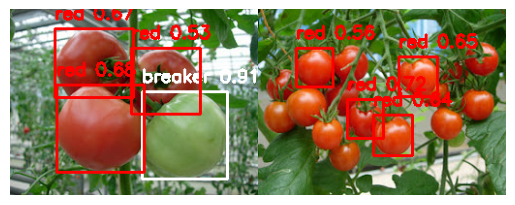


0: 384x640 3 tom_fruit_breaker_polys, 4 tom_fruit_pink_polys, 15 tom_fruit_red_polys, 0.0ms
Speed: 1.5ms preprocess, 0.0ms inference, 19.5ms postprocess per image at shape (1, 3, 384, 640)


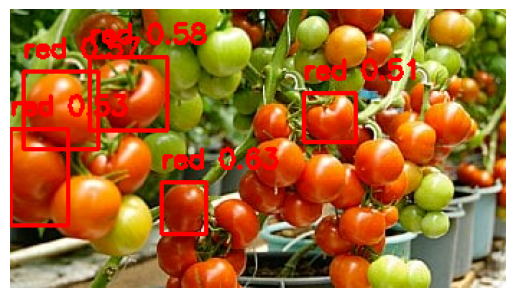

In [22]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# YOLO 모델 로드
model = YOLO('C:/Users/win/runs/detect/train2/weights/best.pt')

# 수정된 클래스 이름이 포함된 YAML 파일 경로
yaml_path = 'C:/Users/win/Desktop/공부/이매지니어/JOLJAK/basic.yaml'

# 테스트 이미지 폴더 경로
test_image_folder = 'D:/JOLJAK/TOMATO_Test'

# 클래스별 색상 지정
class_colors = {
    0: (255, 255, 255),  # breaker: 흰색
    1: (173, 216, 230),  # pink: 하늘색
    2: (0, 0, 255)       # red: 파란색
}

# 폴더 내 이미지 파일들을 순회하면서 예측 실행
for filename in os.listdir(test_image_folder):
    # 확장자가 JPG, WEBP, JFIF인지 확인
    if filename.lower().endswith(('.jpg', '.webp', '.jfif')):
        image_path = os.path.join(test_image_folder, filename)
        
        # 이미지 불러오기
        img = cv2.imread(image_path)
        
        # YOLO 예측 수행 (변경된 YAML 파일 지정)
        results = model.predict(source=img, data=yaml_path)

        # 예측 결과 이미지 생성
        for box in results[0].boxes:
            # 바운딩 박스 정보 추출
            class_id = int(box.cls)
            confidence = box.conf.item()  # Tensor에서 값을 추출

            # 정확도 0.5 이상일 때만 출력
            if confidence >= 0.5:
                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                color = class_colors.get(class_id, (255, 255, 255))  # 클래스별 색상 설정
                
                # 바운딩 박스와 클래스 ID, 신뢰도 그리기
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                cv2.putText(
                    img,
                    f"{['breaker', 'pink', 'red'][class_id]} {confidence:.2f}",
                    (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    color,
                    2
                )

        # 결과 이미지 출력
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()


In [26]:
from ultralytics import YOLO
import cv2

# YOLO 모델 로드
model = YOLO('C:/Users/win/runs/detect/train2/weights/best.pt')

# 테스트할 동영상 경로
video_path = "C:/Users/win/Downloads/76994-561052270_small.mp4"
# 출력 동영상 경로 (결과를 저장하려면 사용)
output_path = 'D:/JOLJAK/TOMATO_Test/output_tomato3.mp4'

# 동영상 파일 열기
cap = cv2.VideoCapture(video_path)

# 동영상 저장을 위한 설정
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # 코덱 설정
out = cv2.VideoWriter(output_path, fourcc, cap.get(cv2.CAP_PROP_FPS), 
                      (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # YOLO 예측 수행 (프레임마다)
    results = model.predict(source=frame)

    # 예측 결과를 프레임에 표시
    frame_with_predictions = results[0].plot()  # 탐지 결과가 그려진 프레임
    
    # 프레임을 출력 (원하는 경우 주석 해제)
    cv2.imshow('Tomato Detection', frame_with_predictions)
    
    # 출력 동영상에 프레임 저장
    out.write(frame_with_predictions)
    
    # 'q' 키를 누르면 종료
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# 모든 작업 완료 후 정리
cap.release()
out.release()
cv2.destroyAllWindows()



0: 384x640 4 tom_fruit_breaker_polys, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 tom_fruit_breaker_polys, 16.2ms
Speed: 8.9ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 tom_fruit_breaker_polys, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 tom_fruit_breaker_polys, 1.6ms
Speed: 16.8ms preprocess, 1.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 tom_fruit_breaker_polys, 7.7ms
Speed: 0.0ms preprocess, 7.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 tom_fruit_breaker_polys, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 tom_fruit_breaker_polys, 13.9ms
Speed: 0.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 

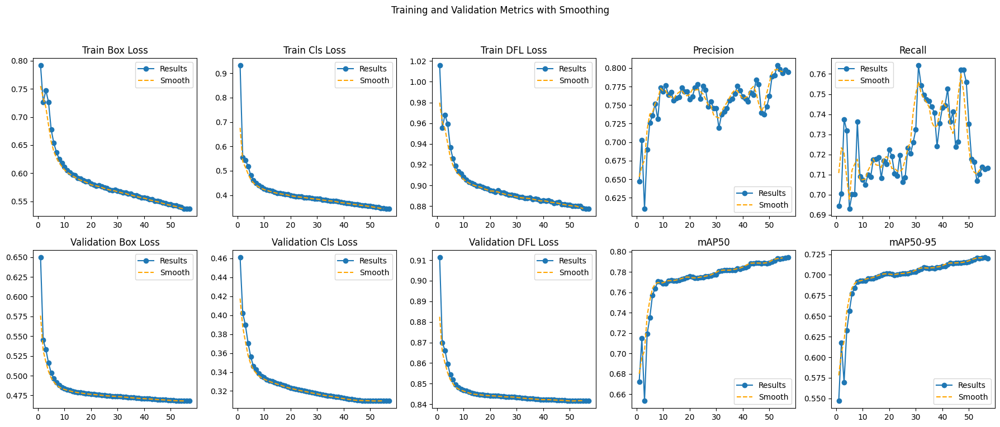

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# CSV 파일을 불러오기
data = pd.read_csv("C:/Users/win/runs/detect/train7/results.csv")  # 여기에 CSV 파일 경로를 넣으세요

# 열 이름의 공백을 제거하고, 모든 열 이름을 소문자로 변환하여 접근하기 쉽게 만듦
data.columns = data.columns.str.strip().str.lower()

# 이동 평균 계산 함수
def moving_average(data, window_size=3):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

# 학습 결과를 그래프로 시각화하는 함수
def plot_training_results(data):
    fig, axs = plt.subplots(2, 5, figsize=(18, 8))
    fig.suptitle("Training and Validation Metrics with Smoothing")

    metrics = [
        ('train/box_loss', 'Train Box Loss'),
        ('train/cls_loss', 'Train Cls Loss'),
        ('train/dfl_loss', 'Train DFL Loss'),
        ('metrics/precision(b)', 'Precision'),
        ('metrics/recall(b)', 'Recall'),
        ('val/box_loss', 'Validation Box Loss'),
        ('val/cls_loss', 'Validation Cls Loss'),
        ('val/dfl_loss', 'Validation DFL Loss'),
        ('metrics/map50(b)', 'mAP50'),
        ('metrics/map50-95(b)', 'mAP50-95')
    ]

    # 각 메트릭을 subplot에 그리기
    for i, (column, title) in enumerate(metrics):
        row, col = divmod(i, 5)
        axs[row, col].plot(data['epoch'], data[column], 'o-', label='Results')
        axs[row, col].plot(data['epoch'][:len(moving_average(data[column]))], moving_average(data[column]), 'orange', linestyle='--', label='Smooth')
        axs[row, col].set_title(title)
        axs[row, col].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout for the suptitle
    plt.show()

# 함수 실행
plot_training_results(data)


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# 이미지가 있는 폴더 경로
image_folder = "D:/JOLJAK/TOMATO_Train"

# '_albu'가 포함된 파일만 찾기
for filename in os.listdir(image_folder):
    if "_albu" not in filename or not filename.endswith('.png'):
        continue
    
    # 이미지 경로 및 해당하는 라벨 파일 경로 설정
    image_path = os.path.join(image_folder, filename)
    label_path = os.path.splitext(image_path)[0] + ".txt"
    
    # 이미지 불러오기
    image = cv2.imread(image_path)
    if image is None:
        print(f"이미지를 불러올 수 없습니다: {image_path}")
        continue
    
    # 라벨 파일 확인 및 읽기
    if not os.path.exists(label_path):
        print(f"라벨 파일이 존재하지 않습니다: {label_path}")
        continue

    with open(label_path, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            class_id = int(float(parts[0]))  # float으로 변환 후 int로 변환
            x_center, y_center, width, height = map(float, parts[1:])
            
            # YOLO 형식을 OpenCV 사각형 좌표로 변환
            img_h, img_w = image.shape[:2]
            x1 = int((x_center - width / 2) * img_w)
            y1 = int((y_center - height / 2) * img_h)
            x2 = int((x_center + width / 2) * img_w)
            y2 = int((y_center + height / 2) * img_h)
            
            # 바운딩 박스 그리기
            color = (0, 255, 0)  # 초록색 바운딩 박스
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, f"Class {class_id}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    
    # OpenCV의 BGR 이미지를 RGB로 변환
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Matplotlib으로 이미지 출력
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"Image with Bounding Boxes: {filename}")
    plt.show()
